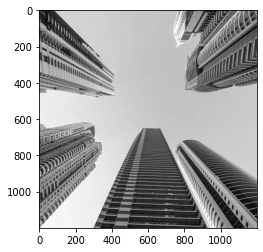

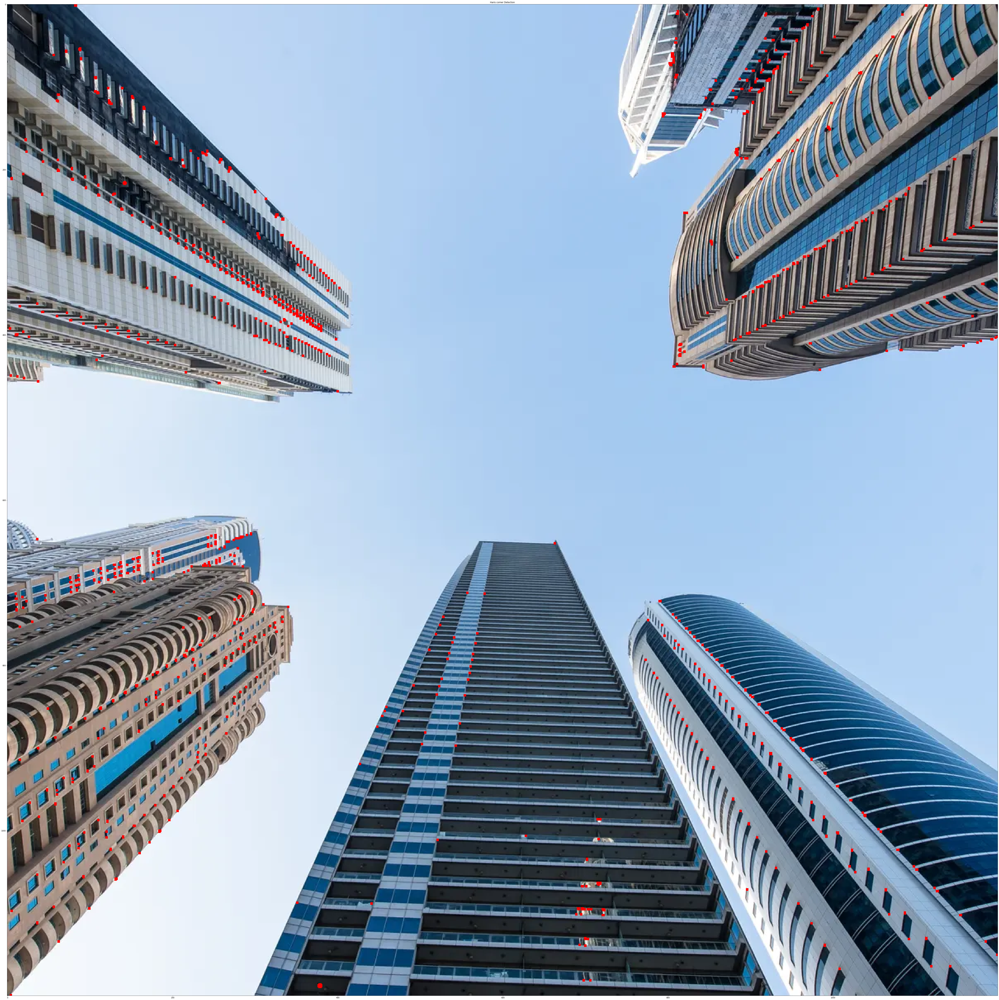

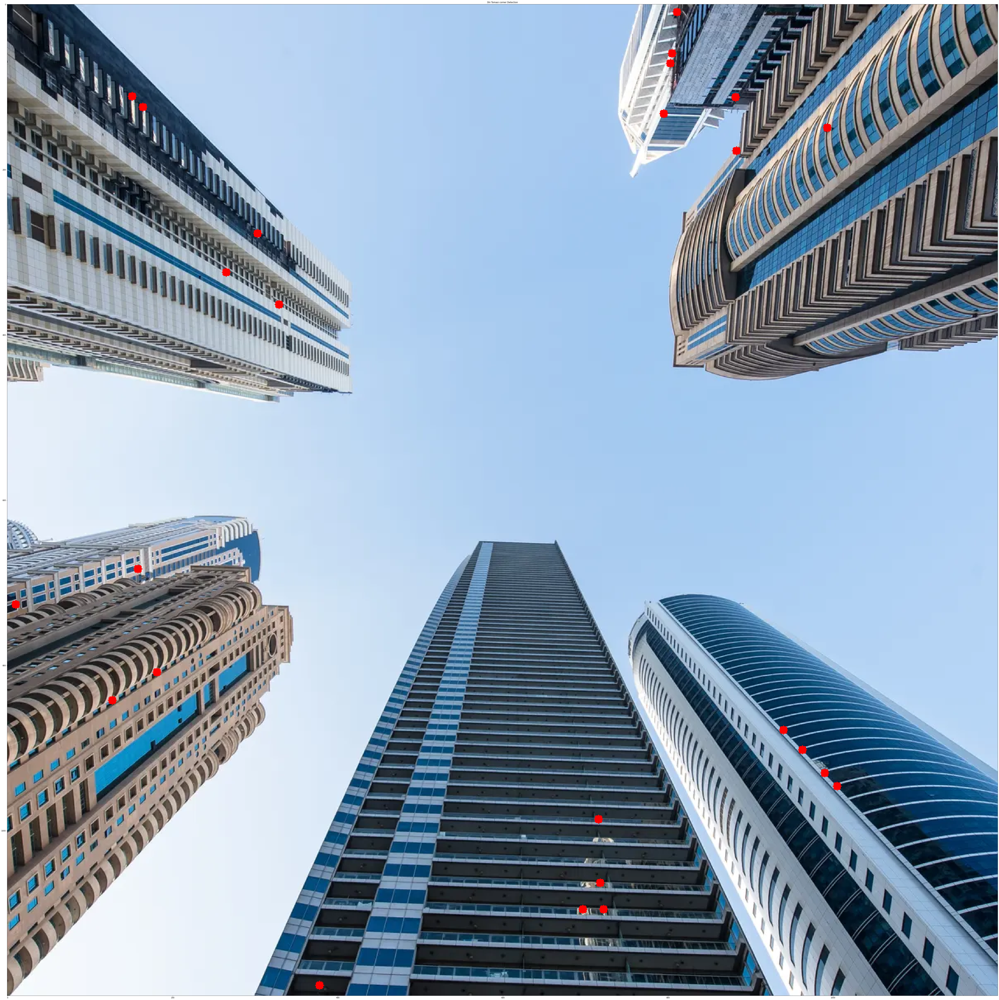

In [2]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

img = cv2.imread('../../Resources/Photos/building.jpg')
rgbimg = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)

gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
plt.imshow(gray,cmap='gray')
plt.show()

gray = np.float32(gray)

# Haris Corner

dst = cv2.cornerHarris(gray,2,3,0.04)

dst = cv2.dilate(dst,None)

rgbimg[dst>0.1*dst.max()]=[255,0,0]
plt.figure(figsize = (100,100))
plt.title(label="Haris corner Detection")
plt.imshow(rgbimg)
plt.show()


# Shi-Tomasi Corner Detector & Good Features to Track
rgbimg = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

corners = cv2.goodFeaturesToTrack(gray,25,0.25,10)
corners = np.int0(corners)

for i in corners:
    x,y = i.ravel()
    cv2.circle(rgbimg,(x,y),5,255,-1)

plt.figure(figsize = (100,100))
plt.title(label="Shi Tomasi corner Detection")
plt.imshow(rgbimg)
plt.show()

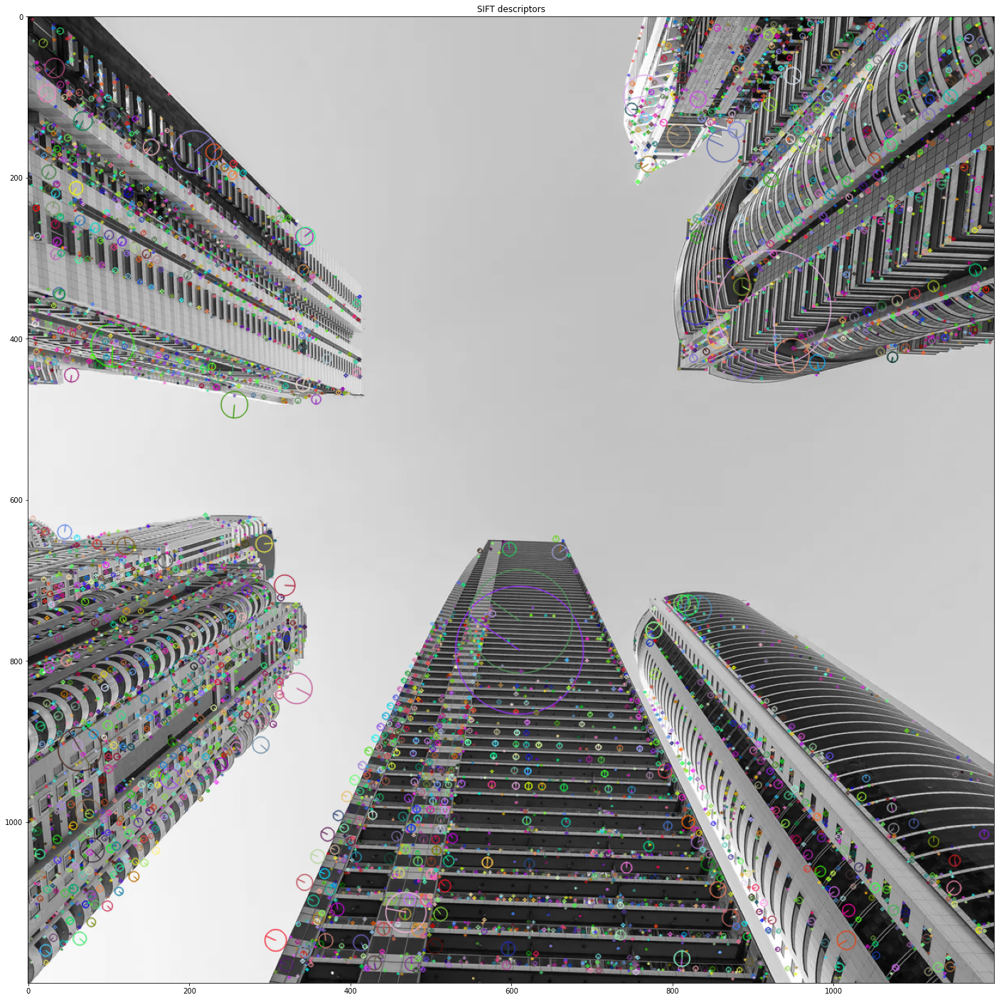

In [3]:
rgbimg = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
plt.figure(figsize = (25,25))
sift = cv2.SIFT_create()
kp = sift.detect(gray,None)
img_descriptors = cv2.drawKeypoints(gray,kp,rgbimg,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

plt.title("SIFT descriptors")
plt.imshow(img_descriptors)
plt.show()

In [4]:
rgbimg = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
surf = cv2.xfeatures2d.SURF_create(400)
kp, des = surf.detectAndCompute(rgbimg,None)

len(kp)

error: OpenCV(4.5.5) D:\a\opencv-python\opencv-python\opencv_contrib\modules\xfeatures2d\src\surf.cpp:1029: error: (-213:The function/feature is not implemented) This algorithm is patented and is excluded in this configuration; Set OPENCV_ENABLE_NONFREE CMake option and rebuild the library in function 'cv::xfeatures2d::SURF::create'


 Number of keypoints wtih non max : 30022
 Number of keypoints without non max : 99453


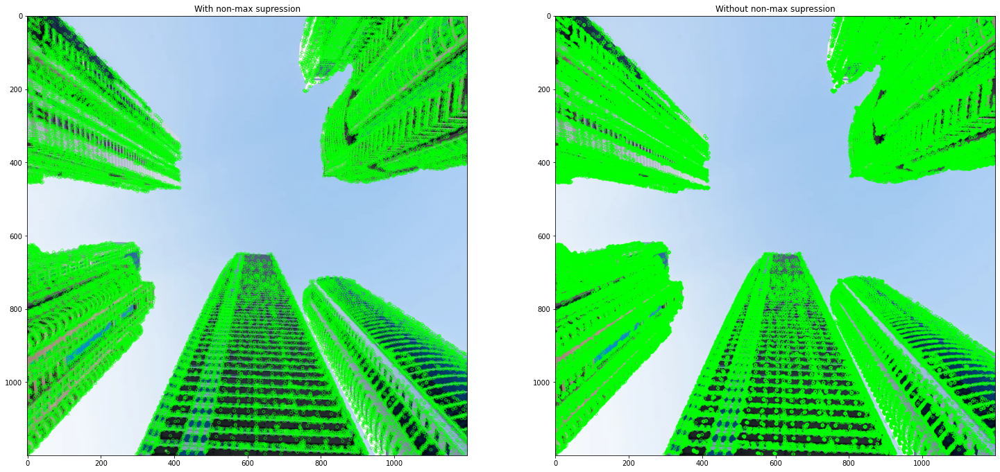

In [7]:
rgbimg = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)

fast = cv2.FastFeatureDetector_create()
kp_with_nonMax = fast.detect(gray,None)

# Disable nonmaxSuppression 
fast.setNonmaxSuppression(False)

kp_without_nonMax = fast.detect(gray,None)

img_with_nonmax = np.copy(rgbimg)
img_without_nonmax = np.copy(rgbimg)

cv2.drawKeypoints(rgbimg, kp_with_nonMax, img_with_nonmax, color=(0,255,0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
cv2.drawKeypoints(rgbimg, kp_without_nonMax, img_without_nonmax, color=(0,255,0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

fx, plots = plt.subplots(1,2,figsize=(25,25))

plots[0].set_title("With non-max supression")
plots[0].imshow(img_with_nonmax)

plots[1].set_title("Without non-max supression")
plots[1].imshow(img_without_nonmax)

print(" Number of keypoints wtih non max :", len(kp_with_nonMax))
print(" Number of keypoints without non max :", len(kp_without_nonMax))

Number of Keypoints Detected In The Training Image:  27340
Number of Keypoints Detected In The Query Image:  960


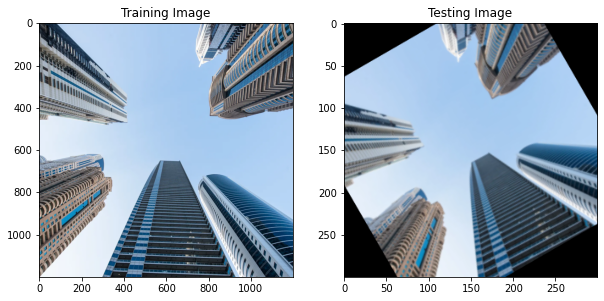

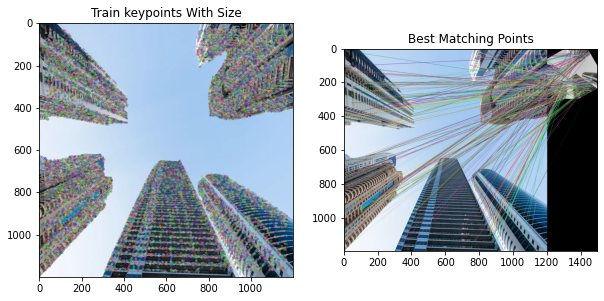


Number of Matching Keypoints Between The Training and Query Images:  290


In [17]:
%matplotlib inline
training_image = rgbimg

# Convert the training image to gray scale
training_gray = cv2.cvtColor(training_image, cv2.COLOR_RGB2GRAY)

# Create test image by adding Scale Invariance and Rotational Invariance
test_image = cv2.pyrDown(training_image)
test_image = cv2.pyrDown(test_image)
num_rows, num_cols = test_image.shape[:2]

rotation_matrix = cv2.getRotationMatrix2D((num_cols/2, num_rows/2), 30, 1)
test_image = cv2.warpAffine(test_image, rotation_matrix, (num_cols, num_rows))

test_gray = cv2.cvtColor(test_image, cv2.COLOR_RGB2GRAY)

# Display traning image and testing image
fx, plots = plt.subplots(1, 2, figsize=(10,10))

plots[0].set_title("Training Image")
plots[0].imshow(training_image)

plots[1].set_title("Testing Image")
plots[1].imshow(test_image)


fast = cv2.FastFeatureDetector_create() 
brief = cv2.xfeatures2d.BriefDescriptorExtractor_create()

train_keypoints = fast.detect(training_gray, None)
test_keypoints = fast.detect(test_gray, None)

train_keypoints, train_descriptor = brief.compute(training_gray, train_keypoints)
test_keypoints, test_descriptor = brief.compute(test_gray, test_keypoints)

keypoints_without_size = np.copy(training_image)
keypoints_with_size = np.copy(training_image)

cv2.drawKeypoints(training_image, train_keypoints, keypoints_without_size, color = (0, 255, 0))

cv2.drawKeypoints(training_image, train_keypoints, keypoints_with_size, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Display image with and without keypoints size
fx, plots = plt.subplots(1, 2, figsize=(10,10))

plots[0].set_title("Train keypoints With Size")
plots[0].imshow(keypoints_with_size, cmap='gray')

plots[1].set_title("Train keypoints Without Size")
plots[1].imshow(keypoints_without_size, cmap='gray')

# Print the number of keypoints detected in the training image
print("Number of Keypoints Detected In The Training Image: ", len(train_keypoints))

# Print the number of keypoints detected in the query image
print("Number of Keypoints Detected In The Query Image: ", len(test_keypoints))



# Create a Brute Force Matcher object.
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)

# Perform the matching between the BRIEF descriptors of the training image and the test image
matches = bf.match(train_descriptor, test_descriptor)

# The matches with shorter distance are the ones we want.
matches = sorted(matches, key = lambda x : x.distance)

result = cv2.drawMatches(training_image, train_keypoints, test_gray, test_keypoints, matches, test_gray, flags = 2)

# Display the best matching points
plt.rcParams['figure.figsize'] = [100.0, 100.0]
plt.title('Best Matching Points')
plt.imshow(result)
plt.show()

# Print total number of matching points between the training and query images
print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))